In [1]:
import os
from pathlib import Path
import sys
base_dir = Path(os.path.dirname(os.path.realpath("__file__"))).parent.parent
sys.path.insert(0, str(base_dir))
import earthnet_minicuber as emc

import matplotlib.pyplot as plt
import numpy as np

# Querying using Minicuber

In [4]:
specs = {
    "lon_lat": (407956,5198972), # topleft pixel
    "xy_shape": (128, 128), # width, height of cutout around center pixel
    "resolution": 10, # in meters.. will use this on a local UTM grid..
    "time_interval": "2022-01-01/2022-01-31",
    "providers": [
        {
            "name": "s2",
            "kwargs": {"bands": ["AOT", "B01", "B02", "B03", "B04", "B05", "B06", "B07", "B08", "B8A", "B09", "B11", "B12", "WVP"], "correct_processing_baseline":False, "brdf_correction": True, "cloud_mask": False, "data_source": "planetary_computer"}
        }
        ]
}

In [5]:
mc = emc.load_minicube(specs, compute = True, verbose=True)

Loading Sentinel2 for 2022-01-01/2022-01-31


In [6]:
mc

<xarray.Dataset> Size: 21MB
Dimensions:              (time: 45, lat: 128, lon: 128)
Coordinates:
  * time                 (time) datetime64[ns] 360B 2022-01-01 ... 2022-01-31
  * lon                  (lon) float64 1kB 4.08e+05 4.08e+05 ... 4.092e+05
  * lat                  (lat) float64 1kB 5.199e+06 5.199e+06 ... 5.198e+06
Data variables: (12/19)
    s2_AOT               (time, lat, lon) uint16 1MB 71 71 71 71 ... 49 49 49 49
    s2_B01               (time, lat, lon) uint16 1MB 420 420 420 ... 5664 5664
    s2_B02               (time, lat, lon) uint16 1MB 439 341 324 ... 4781 4754
    s2_B03               (time, lat, lon) uint16 1MB 559 337 373 ... 4943 4803
    s2_B04               (time, lat, lon) uint16 1MB 669 362 424 ... 5050 5058
    s2_B05               (time, lat, lon) uint16 1MB 575 575 483 ... 5308 5308
    ...                   ...
    s2_WVP               (time, lat, lon) uint16 1MB 859 859 859 ... 284 284 284
    product_uri          (time) <U65 12kB 'S2A_MSIL2A_20220101T102431_N0300_R...
    mean_solar_zenith    (time) float32 180B 71.72 70.84 71.06 ... 65.81 66.09
    mean_solar_azimuth   (time) float32 180B 71.72 70.84 71.06 ... 65.81 66.09
    mean_sensor_zenith   (time) float32 180B 8.333 7.164 11.01 ... 7.162 11.01
    mean_sensor_azimuth  (time) float32 180B 8.333 7.164 11.01 ... 7.162 11.01
Attributes:
    history:                  Created by Sélène Ledain on 2024-05-30 16:07:27...
    source:                   Microsoft Planetary Computer
    coordinates:              EPSG:32632. Coordinates are upper left corners ...
    missing data fill value:  65535
    processing:               Baseline correction, cloud masking, BRDF correc...

# Chunking and storing

In [30]:
mc = mc.r({'time': len(mc.time), 'lat': len(mc.lat), 'lon': len(mc.lon)/2})

In [31]:
mc.chunksizes

Frozen({'time': (145,), 'lat': (128,), 'lon': (64, 64)})

In [16]:
mc.nbytes

260714332

In [4]:
compressor

Blosc(cname='lz4', clevel=5, shuffle=SHUFFLE, blocksize=0)

In [41]:
import zarr 

compressor = zarr.Blosc() #cname='zstd', clevel=3, shuffle=0)
output_path = 'test_cube.zarr'
mc.to_zarr(output_path, consolidated=True, mode='w', encoding={var: {'compressor': compressor} for var in mc.data_vars})

In [42]:
# Verify that the dataset is saved correctly

import xarray as xr 
import os
import time

start = time.time()
ds_loaded = xr.open_zarr(output_path)
end = time.time()
print(f'Loaded in {end-start:.4f} seconds')
ds_loaded

# Function to calculate the size of the Zarr directory
def get_directory_size(path):
    total_size = 0
    for dirpath, dirnames, filenames in os.walk(path):
        for f in filenames:
            fp = os.path.join(dirpath, f)
            total_size += os.path.getsize(fp)
    return total_size

# Calculate the size of the Zarr file
zarr_size = get_directory_size(output_path)

print(f'Size of the Zarr file: {zarr_size} bytes')

Loaded in 0.0150 seconds
Size of the Zarr file: 32682614 bytes


In [19]:
import zarr

zarr.storage.default_compressor

Blosc(cname='lz4', clevel=5, shuffle=SHUFFLE, blocksize=0)

# Plot cloud mask

In [20]:
# Check number of missing values
rgb_plots = mc[["s2_B04", "s2_B03", "s2_B02"]].to_array("band")
print(np.sum(rgb_plots == 65535))

rgb_plots = rgb_plots.where(rgb_plots != 65535, np.nan)
print(np.sum(rgb_plots.isnull()))


<xarray.DataArray ()> Size: 8B
array(75458)
<xarray.DataArray ()> Size: 8B
array(75458)


In [21]:
np.sum(mc == 65535)

<xarray.Dataset> Size: 168B
Dimensions:              ()
Data variables: (12/21)
    s2_AOT               int64 8B 25152
    s2_B01               int64 8B 22712
    s2_B02               int64 8B 25154
    s2_B03               int64 8B 25152
    s2_B04               int64 8B 25152
    s2_B05               int64 8B 25152
    ...                   ...
    s2_mask              int64 8B 0
    product_uri          int64 8B 0
    mean_solar_zenith    int64 8B 0
    mean_solar_azimuth   int64 8B 0
    mean_sensor_zenith   int64 8B 0
    mean_sensor_azimuth  int64 8B 0

In [22]:
# Check cloud mask values where data is missing
rgb_plots = mc[["s2_B04", "s2_B03", "s2_B02"]].to_array("band")
mask = (rgb_plots == 65535).any(dim='band')
s2_mask_values = mc["s2_mask"].where(mask, drop=True)

# Print the result
print(np.unique(s2_mask_values))

[ 4. nan]


In [23]:
# Check the possible cloud mask values
print(np.unique(mc["s2_mask"])) 

[0 1 2 3 4]


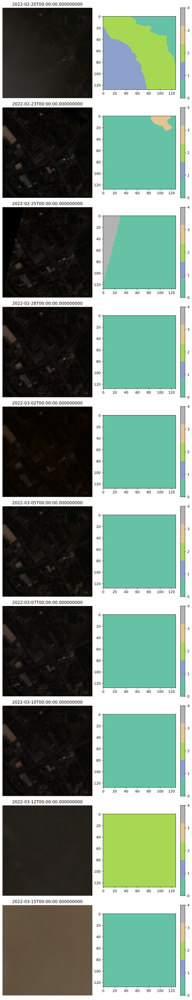

In [41]:
rgb_plots = mc[["s2_B04", "s2_B03", "s2_B02"]].to_array("band")
rgb_plots = rgb_plots.where(rgb_plots != 65535, np.nan)
#rgb_plots = rgb_plots.where(~rgb_plots.isnull().any(dim='band')) # if any of the bands is missing, mask out pixel
rgb_plots = rgb_plots/10000

# Calculate global min and max for each band
global_min = rgb_plots.min(dim=['time', 'lat', 'lon'])
global_max = rgb_plots.max(dim=['time', 'lat', 'lon'])

# Set up the figure and axes
num_im = len(mc.time)
fig, axes = plt.subplots(10, 2, figsize=(8, 10 * 4))

for i in range(num_im):
      if i > 29:
            break 
      if i >=20:
            i_plot = i - 20
            
            rgb_time = rgb_plots.isel(time=i)
            cloud_mask = mc.isel(time=i).s2_mask

            # Rescale to 0-255
            rescaled_arr = np.empty_like(rgb_time, dtype=np.uint8)

            for b in range(rgb_time.shape[0]):
                  band_data = rgb_time[b]  # Select data for the current band
                  # Calculate the min and max values for the current band
                  band_min = global_min[b]
                  band_max = global_max[b]
                  # Rescale the data for the current band to 0-255 range
                  rescaled_band = ((band_data - band_min) * (1 / (band_max - band_min) * 255)).astype(np.uint8)
                  # Assign the rescaled data to the corresponding band in the new array
                  rescaled_arr[b] = rescaled_band
                  
            
            # Plot the RGB image for the current time step and image
            axes[i_plot, 0].imshow(rescaled_arr.transpose(1,2,0), vmin=0, vmax=1) #transpose('lat', 'lon', 'band')
            axes[i_plot, 0].set_title(f"{str(mc.time.values[i])}")  
            axes[i_plot, 0].axis('off')  # Turn off axis  

            # Plot the cloud mask for the current time step and image
            img = axes[i_plot, 1].imshow(cloud_mask, cmap=plt.cm.get_cmap('Set2', 5), vmin=0, vmax=4)
            #fig.colorbar(img, ax=axes[i, 1])

            # Add a color bar
            cbar = plt.colorbar(img, ax=axes[i_plot, 1], ticks=[0, 1, 2, 3, 4])
            cbar.ax.set_yticklabels(['0', '1', '2', '3', '4'])

         
      
      
plt.tight_layout()
plt.show()

## Check difference overlapping tiles (in different tiles, same timestep)
- center coords (7.7907, 46.9379), year of 2022

In [49]:
from pyproj import Transformer

transformer = Transformer.from_crs(4326, 32632, always_xy=True)
# Reproject the coordinate to EPSG:32632
easting, northing = transformer.transform(7.7907, 46.9379)
print(f"Reprojected coordinate in EPSG:32632: Easting = {easting}, Northing = {northing}")

Reprojected coordinate in EPSG:32632: Easting = 407956.2538541248, Northing = 5198972.933100886


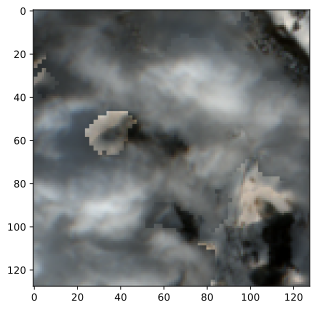

In [8]:
rgb_plots = mc[["s2_B04", "s2_B03", "s2_B02"]].to_array("band")
rgb_plots = rgb_plots.where(rgb_plots != 65535, np.nan)
rgb_plots = rgb_plots/10000

# Calculate global min and max for each band
global_min = rgb_plots.min(dim=['time', 'lat', 'lon'])
global_max = rgb_plots.max(dim=['time', 'lat', 'lon'])

rgb_time = rgb_plots.isel(time=14)

rescaled_arr = np.empty_like(rgb_time, dtype=np.uint8)

for b in range(rgb_time.shape[0]):
      band_data = rgb_time[b]  # Select data for the current band
      # Calculate the min and max values for the current band
      band_min = global_min[b]
      band_max = global_max[b]
      # Rescale the data for the current band to 0-255 range
      rescaled_band = ((band_data - band_min) * (1 / (band_max - band_min) * 255)).astype(np.uint8)
      # Assign the rescaled data to the corresponding band in the new array
      rescaled_arr[b] = rescaled_band
            
fig, ax = plt.subplots(1, 1, figsize=(5, 5))
ax.imshow(rescaled_arr.transpose(1,2,0), vmin=0.0, vmax=1) 

In [60]:
rgb_time.isel(band=0, lat=slice(50,60), lon=slice(30,40))

<xarray.DataArray (lat: 10, lon: 10)> Size: 800B
array([[1.2489, 1.258 , 1.2436, 1.1965, 1.1159, 1.0825, 1.0749, 1.0506,
        1.0521, 1.0172],
       [1.176 , 1.1775, 1.1646, 1.119 , 1.059 , 1.0362, 1.0278, 0.9944,
        0.9944, 0.9291],
       [1.1289, 1.1159, 1.0992, 1.0514, 1.0119, 0.9891, 1.0028, 0.9739,
        0.9382, 0.8432],
       [1.0825, 1.0324, 1.0073, 0.9534, 0.9291, 0.9526, 0.9716, 0.907 ,
        0.7669, 0.6833],
       [1.0415, 1.0058, 0.9427, 0.8523, 0.8349, 0.8075, 0.7209, 0.6218,
        0.5336, 0.5215],
       [1.0081, 0.9465, 0.8941, 0.8333, 0.6233, 0.5363, 0.4877, 0.4512,
        0.4311, 0.4554],
       [0.9891, 0.926 , 0.7771, 0.5918, 0.4979, 0.4482, 0.4531, 0.422 ,
        0.3637, 0.3889],
       [0.9891, 0.716 , 0.5488, 0.4425, 0.4087, 0.4185, 0.4341, 0.4155,
        0.3701, 0.3464],
       [0.7665, 0.6005, 0.4486, 0.3652, 0.3621, 0.3885, 0.3916, 0.4034,
        0.4387, 0.4345],
       [0.7114, 0.5773, 0.452 , 0.3804, 0.364 , 0.3847, 0.3954, 0.4174,
        0.4812, 0.5393]])
Coordinates:
    time     datetime64[ns] 8B 2022-01-11
  * lon      (lon) float64 80B 4.083e+05 4.083e+05 ... 4.083e+05 4.083e+05
  * lat      (lat) float64 80B 5.198e+06 5.198e+06 ... 5.198e+06 5.198e+06
    band     <U6 24B 's2_B04'

In [45]:
rgb_plots = mc[["s2_B04", "s2_B03", "s2_B02"]].to_array("band")
rgb_plots = rgb_plots.where(rgb_plots != 65535, np.nan)
rgb_plots = rgb_plots/10000

# Calculate global min and max for each band
global_min = rgb_plots.min(dim=['time', 'lat', 'lon'])
global_max = rgb_plots.max(dim=['time', 'lat', 'lon'])

# Set up the figure and axes
num_time_steps = 10 #len(np.unique(rgb_plots.time))
fig, axes = plt.subplots(num_time_steps, 4, figsize=(15, num_time_steps * 4))
counter = 0

for i, t in enumerate(np.unique(rgb_plots.time)):
      
      i_plot = i 
      rgb_time = rgb_plots.sel(time=t)

      # Rescale to 0-255
      rescaled_arr = np.empty_like(rgb_time, dtype=np.uint8)

      for b in range(rgb_time.shape[0]):
            band_data = rgb_time[b]  # Select data for the current band
            # Calculate the min and max values for the current band
            band_min = global_min[b]
            band_max = global_max[b]
            # Rescale the data for the current band to 0-255 range
            rescaled_band = ((band_data - band_min) * (1 / (band_max - band_min) * 255)).astype(np.uint8)
            # Assign the rescaled data to the corresponding band in the new array
            rescaled_arr[b] = rescaled_band
            

      if rescaled_arr.ndim ==4: # There are repeated timesteps
            for j in range(rescaled_arr.shape[1]):
                  
                  # Plot the RGB image for the current time step and image
                  axes[i_plot, j].imshow(rescaled_arr[:, j, :, :].transpose(1,2,0), vmin=0.0, vmax=1) #transpose('lat', 'lon', 'band')
                  axes[i_plot, j].set_title(f"{mc.product_uri.values[counter].split('_')[5]}: {str(t).split('T')[0]}")  # Set title with timestamp and image index
                  axes[i_plot, j].axis('off')  # Turn off axis

                  counter += 1
                  
      if rescaled_arr.ndim ==3: # There are no repeated timesteps
            # Plot the RGB image for the current time step and image
            axes[i_plot, 0].imshow(rescaled_arr.transpose(1,2,0), vmin=0.0, vmax=1) #transpose('lat', 'lon', 'band')
            axes[i_plot, 0].set_title(f"{mc.product_uri.values[counter].split('_')[5]}: {str(t).split('T')[0]}")  # Set title with timestamp and image index
            axes[i_plot, 0].axis('off')  # Turn off axis

            counter += 1

      if i == 9:
            break     
      
      
plt.tight_layout()
plt.show()

In [10]:
# Find dates with most/least clouds

s2_mask = mc["s2_mask"]
cloud_count_per_time = (s2_mask == 1).sum(dim=['lat', 'lon'])
cloudy_time_descending = cloud_count_per_time.sortby(cloud_count_per_time, ascending=False).time

cloudiest = cloudy_time_descending[0]
least = cloudy_time_descending[-10] #if choose -1 then its somewhere in jan with a lot of snow
print('Cloudiest', cloudiest.time.values)
print('Least cloudy', least.time.values)

Cloudiest 2022-12-30T00:00:00.000000000
Least cloudy 2022-01-16T00:00:00.000000000


In [13]:
# Mean std across same timestep

std_dev = mc.where(mc != 65535).groupby('time').std(dim='time')
mean_std = std_dev.mean(dim=['lat', 'lon']) 

print('Cloudiest', mean_std.sel(time=cloudiest))
print('Least cloudy', mean_std.sel(time=least))

Cloudiest <xarray.Dataset> Size: 88B
Dimensions:              ()
Coordinates:
    time                 datetime64[ns] 8B 2022-12-30
Data variables: (12/20)
    s2_AOT               float32 4B 0.0004883
    s2_B01               float32 4B 207.1
    s2_B02               float32 4B 151.7
    s2_B03               float32 4B 105.8
    s2_B04               float32 4B 67.01
    s2_B05               float32 4B 49.14
    ...                   ...
    s2_SCL               float32 4B 0.0
    s2_mask              float32 4B 0.1524
    mean_solar_zenith    float32 4B 0.4542
    mean_solar_azimuth   float32 4B 0.4542
    mean_sensor_zenith   float32 4B 2.021
    mean_sensor_azimuth  float32 4B 2.021
Least cloudy <xarray.Dataset> Size: 88B
Dimensions:              ()
Coordinates:
    time                 datetime64[ns] 8B 2022-01-16
Data variables: (12/20)
    s2_AOT               float32 4B 12.59
    s2_B01               float32 4B 78.22
    s2_B02               float32 4B 78.59
    s2_B03          

In [14]:
# Overall mean std per timestep


std_dev = mc.where(mc != 65535).groupby('time').std(dim='time')
mean_std = std_dev.mean(dim=['lat', 'lon', 'time'])
mean_std 

<xarray.Dataset> Size: 80B
Dimensions:              ()
Data variables: (12/20)
    s2_AOT               float32 4B 18.12
    s2_B01               float32 4B 2.886e+03
    s2_B02               float32 4B 2.143e+03
    s2_B03               float32 4B 1.099e+03
    s2_B04               float32 4B 958.9
    s2_B05               float32 4B 383.8
    ...                   ...
    s2_SCL               float32 4B 0.07941
    s2_mask              float32 4B 0.04203
    mean_solar_zenith    float32 4B 0.3927
    mean_solar_azimuth   float32 4B 0.3927
    mean_sensor_zenith   float32 4B 1.776
    mean_sensor_azimuth  float32 4B 1.776

In [15]:
# Mean std of reflectances across same timestep

mc_filtered = mc.drop_vars('product_uri')
mc_filtered = mc_filtered/10000
std_dev = mc_filtered.where(mc_filtered != 65535).groupby('time').std(dim='time')
mean_std = std_dev.mean(dim=['lat', 'lon'])#.isel(time=5)

print('Cloudiest', mean_std.sel(time=cloudiest))
print('Least cloudy', mean_std.sel(time=least))

Cloudiest <xarray.Dataset> Size: 152B
Dimensions:              ()
Coordinates:
    time                 datetime64[ns] 8B 2022-12-30
Data variables: (12/20)
    s2_AOT               float64 8B 4.883e-08
    s2_B01               float64 8B 0.02071
    s2_B02               float64 8B 0.01517
    s2_B03               float64 8B 0.01058
    s2_B04               float64 8B 0.006701
    s2_B05               float64 8B 0.004914
    ...                   ...
    s2_SCL               float64 8B 0.0
    s2_mask              float64 8B 1.524e-05
    mean_solar_zenith    float32 4B 4.542e-05
    mean_solar_azimuth   float32 4B 4.542e-05
    mean_sensor_zenith   float32 4B 0.0002021
    mean_sensor_azimuth  float32 4B 0.0002021
Least cloudy <xarray.Dataset> Size: 152B
Dimensions:              ()
Coordinates:
    time                 datetime64[ns] 8B 2022-01-16
Data variables: (12/20)
    s2_AOT               float64 8B 0.001259
    s2_B01               float64 8B 0.007822
    s2_B02               

In [16]:
# Stddev of the range at each timestep

mc_filtered = mc.where(mc != 65535).drop_vars('product_uri')
max_per_timestep = mc_filtered.max(dim=['lat', 'lon'])
min_per_timestep = mc_filtered.min(dim=['lat', 'lon'])
range_per_timestep = max_per_timestep - min_per_timestep
std_dev_range = range_per_timestep.groupby('time').std(dim='time')

print('Cloudiest', std_dev_range.sel(time=cloudiest))
print('Least cloudy', std_dev_range.sel(time=least))

Cloudiest <xarray.Dataset> Size: 88B
Dimensions:              ()
Coordinates:
    time                 datetime64[ns] 8B 2022-12-30
Data variables: (12/20)
    s2_AOT               float32 4B 0.0
    s2_B01               float32 4B 4.743
    s2_B02               float32 4B 5.831
    s2_B03               float32 4B 1.479
    s2_B04               float32 4B 2.915
    s2_B05               float32 4B 3.031
    ...                   ...
    s2_SCL               float32 4B 0.0
    s2_mask              float32 4B 0.433
    mean_solar_zenith    float32 4B 0.0
    mean_solar_azimuth   float32 4B 0.0
    mean_sensor_zenith   float32 4B 0.0
    mean_sensor_azimuth  float32 4B 0.0
Least cloudy <xarray.Dataset> Size: 88B
Dimensions:              ()
Coordinates:
    time                 datetime64[ns] 8B 2022-01-16
Data variables: (12/20)
    s2_AOT               float32 4B 0.4714
    s2_B01               float32 4B 33.63
    s2_B02               float32 4B 145.5
    s2_B03               float32 4B 

In [17]:
# Normalise each band at each timestep, compare normalised values

mc_filtered = mc.where(mc != 65535).drop_vars('product_uri')
normalized_mc = (mc_filtered - mc_filtered.min(dim=['lat', 'lon'])) / (mc_filtered.max(dim=['lat', 'lon']) - mc_filtered.min(dim=['lat', 'lon']))

std_dev_normalized = normalized_mc.groupby('time').std(dim='time').mean(dim=['lat', 'lon'])

print('Cloudiest', std_dev_normalized.sel(time=cloudiest))
print('Least cloudy', std_dev_normalized.sel(time=least))

Cloudiest <xarray.Dataset> Size: 88B
Dimensions:              ()
Coordinates:
    time                 datetime64[ns] 8B 2022-12-30
Data variables: (12/20)
    s2_AOT               float32 4B 0.0002441
    s2_B01               float32 4B 0.003783
    s2_B02               float32 4B 0.004154
    s2_B03               float32 4B 0.004527
    s2_B04               float32 4B 0.005628
    s2_B05               float32 4B 0.002483
    ...                   ...
    s2_SCL               float32 4B nan
    s2_mask              float32 4B 0.1118
    mean_solar_zenith    float32 4B nan
    mean_solar_azimuth   float32 4B nan
    mean_sensor_zenith   float32 4B nan
    mean_sensor_azimuth  float32 4B nan
Least cloudy <xarray.Dataset> Size: 88B
Dimensions:              ()
Coordinates:
    time                 datetime64[ns] 8B 2022-01-16
Data variables: (12/20)
    s2_AOT               float32 4B 0.03349
    s2_B01               float32 4B 0.008855
    s2_B02               float32 4B 0.006009
    s2_

## Check difference orbits
- center coords (6.52, 46.3736)

In [45]:
from pyproj import Transformer

transformer = Transformer.from_crs(4326, 32632, always_xy=True)
# Reproject the coordinate to EPSG:32632
easting, northing = transformer.transform(7.9199, 47.3130)
print(f"Reprojected coordinate in EPSG:32632: Easting = {easting}, Northing = {northing}")

Reprojected coordinate in EPSG:32632: Easting = 418365.9370916005, Northing = 5240513.253628458


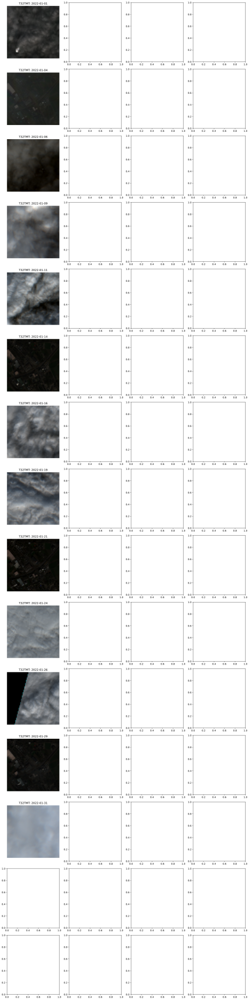

In [23]:
rgb_plots = mc[["s2_B04", "s2_B03", "s2_B02"]].to_array("band")
rgb_plots = rgb_plots.where(rgb_plots != 65535, np.nan)
rgb_plots = rgb_plots/10000

# Calculate global min and max for each band
global_min = rgb_plots.min(dim=['time', 'lat', 'lon'])
global_max = rgb_plots.max(dim=['time', 'lat', 'lon'])

# Set up the figure and axes
num_time_steps = 15 #len(np.unique(rgb_plots.time))
fig, axes = plt.subplots(num_time_steps, 4, figsize=(15, num_time_steps * 4))
counter = 0

for i, t in enumerate(np.unique(rgb_plots.time)):
      if i>=0:
            i_plot = i - 0
            rgb_time = rgb_plots.sel(time=t)

            # Rescale to 0-255
            rescaled_arr = np.empty_like(rgb_time, dtype=np.uint8)

            for b in range(rgb_time.shape[0]):
                  band_data = rgb_time[b]  # Select data for the current band
                  # Calculate the min and max values for the current band
                  band_min = global_min[b] 
                  band_max = global_max[b] 
                  # Rescale the data for the current band to 0-255 range
                  rescaled_band = ((band_data - band_min) * (1 / (band_max - band_min) * 255)).astype(np.uint8)
                  # Assign the rescaled data to the corresponding band in the new array
                  rescaled_arr[b] = rescaled_band

            if rescaled_arr.ndim ==4: # There are repeated timesteps
                  for j in range(rescaled_arr.shape[1]):
                        
                        # Plot the RGB image for the current time step and image
                        axes[i_plot, j].imshow(rescaled_arr[:, j, :, :].transpose(1,2,0), vmin=0.0, vmax=1.5) #transpose('lat', 'lon', 'band')
                        axes[i_plot, j].set_title(f"{mc.product_uri.values[counter].split('_')[5]}: {str(t).split('T')[0]}")  # Set title with timestamp and image index
                        axes[i_plot, j].axis('off')  # Turn off axis

                        counter += 1
            
            if rescaled_arr.ndim ==3: # There are no repeated timesteps
                  # Plot the RGB image for the current time step and image
                  axes[i_plot, 0].imshow(rescaled_arr.transpose(1,2,0), vmin=0.0, vmax=1.5) #transpose('lat', 'lon', 'band')
                  axes[i_plot, 0].set_title(f"{mc.product_uri.values[counter].split('_')[5]}: {str(t).split('T')[0]}")  # Set title with timestamp and image index
                  axes[i_plot, 0].axis('off')  # Turn off axis

                  counter += 1
            
            if i == 15:
                  break
      
      
plt.tight_layout()
plt.show()

## Saving to zarr

In [ ]:
def save_cube(cube, n_cells, patch_size=128, resolution=10):
    """
    Take a xarrays, slice into patches of 128x128 pixels, compress and save to zarr store
    
    :param mc: xarray, containing a year of Sentinel-2 data
    :param n_cells: n_cells^2 is the number of patches of 128x128 in the xarray
    """

    # Get the extent of the cube (lat, lon)
    lat_min, lat_max = cube.lat.min().values, cube.lat.max().values
    lon_min, lon_max = cube.lon.min().values, cube.lon.max().values
    print(lat_min, lat_max, lon_min, lon_max)

    # Extract the start and end dates
    
    # Create compressor
    #compressor = zarr.Blosc(cname='zstd', clevel=3, shuffle=2)
    
    # Iterate over each patch
    for i in range(n_cells):
        for j in range(n_cells):
            lat_start = lat_min + i * patch_size * resolution
            lat_end = lat_start + patch_size * resolution
            lon_start = lon_min + j * patch_size * resolution
            lon_end = lon_start + patch_size * resolution

            print(lat_start, lat_end, lon_start, lon_end)
            
            # Slice the cube
            patch = cube.sel(lat=slice(lat_end, lat_start), lon=slice(lon_start, lon_end))
            print(patch.dims)
            """ 
            # Define the output path for the Zarr store
            output_path = f'path/to/save/patch_{lon_start}_{lat_start}_{lon_end}_{lat_end}.zarr'
            #startyear_startmonth_startday_endyear_endmonth_endday_minx_miny_maxx_maxy.zarr
            
            # Save the patch to Zarr with compression
            patch.to_zarr(output_path, consolidated=True, mode='w', encoding={var: {'compressor': compressor} for var in patch.data_vars})
            """
    return

In [ ]:
lat_end = 5196426.637323313 
lat_start = 5195146.637323313

In [ ]:
lat_end - lat_start

In [ ]:
lat_min, lat_max = mc.lat.min().values, mc.lat.max().values
print(lat_min, lat_,ax)

In [ ]:
mc.sel(lat=slice(lat_end, lat_start))

In [ ]:
save_cube(mc, 3)

In [ ]:
mc

In [ ]:
# Chunk along time dimension

chunk_sizes = {"time": len(mc.time), "lon": 128, "lat": 128}
stack_chunked = mc.chunk(chunk_sizes)

In [ ]:
stack_chunked

In [ ]:
# Slice the dataset

stack_chunked.sel(lat=slice(46.92, 46.91), lon=slice(7.71, 7.72))

In [ ]:
# Save to zarr
import xarray as xr 

zarr_store_path = "test.zarr"
stack_chunked.to_zarr(zarr_store_path, mode='w')

# Verify that the dataset is saved correctly
ds_loaded = xr.open_zarr(zarr_store_path)
ds_loaded

In [ ]:
ds_loaded.compute()